In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'
%qtconsole

In [2]:
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

import logging
logging.basicConfig(level=logging.INFO)

In [3]:
from src.parameters import ANIMALS, SAMPLING_FREQUENCY, USE_LIKELIHOODS, BRAIN_AREAS

epoch_key = ('bon', 3, 2)

In [4]:
import itertools
from src.load_data import load_data

speed_metric='linear_speed'
position_metric = 'linear_distance'

data_types = set(itertools.chain(*USE_LIKELIHOODS.values()))
data = load_data(epoch_key, ANIMALS, SAMPLING_FREQUENCY, data_types,
                 BRAIN_AREAS, speed_metric)

INFO:src.load_data:Loading Data...
INFO:spectral_connectivity.transforms:Multitaper(sampling_frequency=1500, time_halfbandwidth_product=1,
           time_window_duration=0.02, time_window_step=0.02,
           detrend_type='constant', start_time=3729.0257, n_tapers=1)
INFO:src.load_data:Finding multiunit high synchrony events...
INFO:src.load_data:Finding ripple times...


In [120]:
from replay_classification.core import filter, smooth
from replay_identification.multiunit_likelihood import estimate_replay_log_likelihood

def predict_position_from_multiunit(replay_detector, multiunits, use_smoother):
    multiunits = np.asarray(multiunits.copy())
    likelihood_model = replay_detector._multiunit_likelihood.keywords
    place_bin_centers = replay_detector.place_bin_centers
    occupancy_model = likelihood_model['occupancy_model']
    joint_models = likelihood_model['joint_models']
    marginal_models = likelihood_model['marginal_models']
    mean_rates = likelihood_model['mean_rates']
    time_bin_size = replay_detector.time_bin_size

    likelihood = np.exp(estimate_replay_log_likelihood(
        np.moveaxis(multiunits, -1, 0), place_bin_centers,
        occupancy_model, joint_models, marginal_models, mean_rates,
        time_bin_size))
    place_bin_size = np.diff(replay_detector.place_bin_edges)[0]

    state_transition = replay_detector._movement_state_transition
    initial_conditions = (np.ones_like(place_bin_centers) /
                          place_bin_centers.size / place_bin_size)
    results = filter(
        initial_conditions=initial_conditions,
        state_transition=state_transition,
        likelihood=likelihood,
        bin_size=place_bin_size)

    if use_smoother:
        results = smooth(
            filter_posterior=results['posterior_density'][..., np.newaxis, :],
            state_transition=state_transition,
            bin_size=place_bin_size)
        results['likelihood'] = likelihood

    max_ind = np.argmax(np.log(results['posterior_density'].squeeze()), axis=1)
    return place_bin_centers[max_ind]


In [11]:
from sklearn.model_selection import TimeSeriesSplit
from replay_identification import ReplayDetector
from sklearn.mixture import BayesianGaussianMixture
from sklearn.metrics import mean_squared_error


use_smoother = True
cv = TimeSeriesSplit(n_splits=5)
time = data['position_info'].index
rmse = []

replay_detector = ReplayDetector(
    multiunit_density_model=BayesianGaussianMixture,
    multiunit_model_kwargs=dict(n_components=30, tol=1E-6, max_iter=200,
                                weight_concentration_prior=1E1),
    replay_speed=1)

for train_index, test_index in cv.split(time):
    train_is_replay = data['is_ripple'].iloc[train_index]
    train_position_info = data['position_info'].iloc[train_index]
    if data['spikes'] is not None:
        train_spikes = data['spikes'].iloc[train_index]
    else:
        train_spikes = None
    if data['spikes'] is not None:
        train_multiunit = data['multiunit'].isel(time=train_index)
    else:
        train_multiunit = None
    replay_detector.fit(
        is_replay=train_is_replay, speed=train_position_info[speed_metric],
        position=train_position_info[position_metric], lfp_power=None,
        spikes=train_spikes, multiunit=train_multiunit)

    if 'multiunit' in data_types:
        test_multiunit = data['multiunit'].isel(time=test_index)
        predicted_position = predict_position_from_multiunit(
            replay_detector, test_multiunit, use_smoother)
    elif 'spikes' in data_types:
        test_spikes = data['spikes'].iloc(time=test_index)
        predicted_position = predict_position_from_spikes(
            replay_detector, test_spikes, use_smoother)

    true_position = (data['position_info'][position_metric]
                     .iloc[test_index].values)
    rmse.append(np.sqrt(mean_squared_error(
        true_position, predicted_position)))
    

(232750, 4, 14)
(465498, 4, 14)
(698246, 4, 14)
(930994, 4, 14)
(1163742, 4, 14)


In [157]:
from itertools import product
n_components = np.array([15, 30, 45])
weight_concentration_prior = np.logspace(-2, 2, 5)

grid_parameters = [
    dict(n_components=n, tol=1E-6, max_iter=200, weight_concentration_prior=w)
    for n, w in product(n_components, weight_concentration_prior)]


INFO:replay_identification.decoders:Fitting speed model...
INFO:replay_identification.decoders:Fitting multiunit model...
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try dif

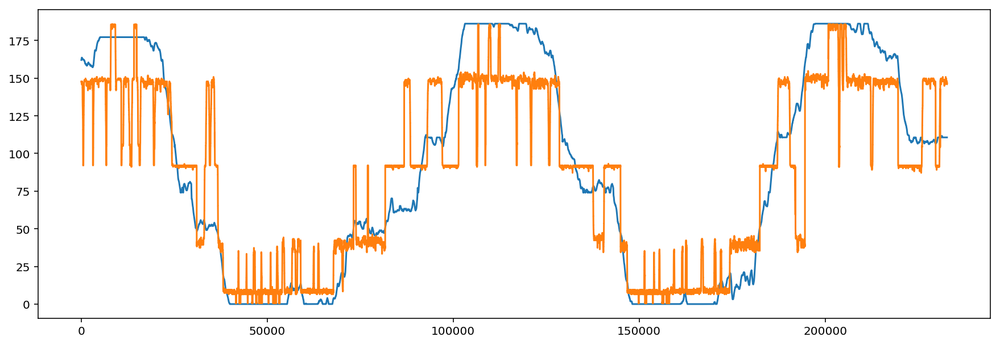

In [292]:
from sklearn.model_selection import TimeSeriesSplit
from replay_identification import ReplayDetector
from sklearn.mixture import BayesianGaussianMixture
from sklearn.metrics import mean_squared_error

use_smoother = True
cv = TimeSeriesSplit(n_splits=5)
time = data['position_info'].index
rmse = []
data_types = {'multiunit'}

replay_detector = ReplayDetector(
    multiunit_density_model=BayesianGaussianMixture,
    multiunit_model_kwargs=dict(n_components=12, tol=1E-6, max_iter=200,
                                weight_concentration_prior=1E2),
    replay_speed=1)

train_index, test_index = next(cv.split(time))

train_is_replay = data['is_ripple'].iloc[train_index]
train_position_info = data['position_info'].iloc[train_index]
if 'spikes' in data_types:
    train_spikes = data['spikes'].iloc[train_index]
else:
    train_spikes = None
if 'multiunit' in data_types:
    train_multiunit = data['multiunit'].isel(time=train_index)
else:
    train_multiunit = None
replay_detector.fit(
    is_replay=train_is_replay, speed=train_position_info[speed_metric],
    position=train_position_info[position_metric], lfp_power=None,
    spikes=train_spikes, multiunit=train_multiunit)

if 'multiunit' in data_types:
    test_multiunit = data['multiunit'].isel(time=test_index)
    predicted_position = predict_position_from_multiunit(
        replay_detector, test_multiunit, use_smoother)
elif 'spikes' in data_types:
    test_spikes = data['spikes'].iloc(time=test_index)
    predicted_position = predict_position_from_spikes(
        replay_detector, test_spikes, use_smoother)

true_position = (data['position_info'][position_metric]
                 .iloc[test_index].values)

plt.figure(figsize=(15, 5))
plt.plot(true_position)
plt.plot(predicted_position);

INFO:replay_identification.decoders:Fitting speed model...
INFO:replay_identification.decoders:Fitting multiunit model...
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try dif

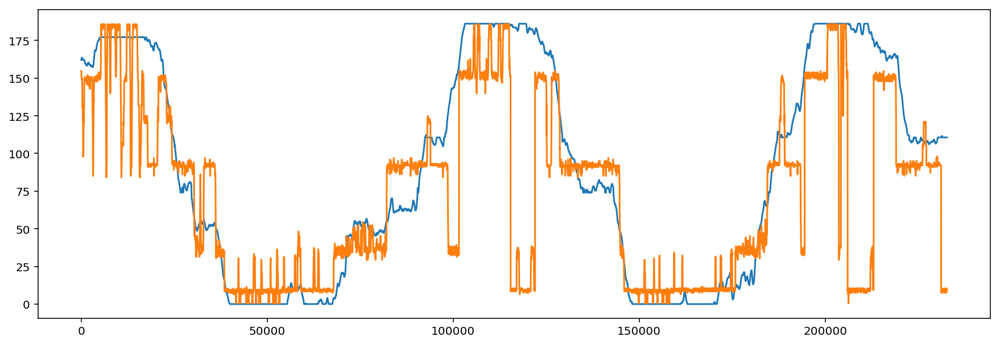

In [293]:
from sklearn.model_selection import TimeSeriesSplit
from replay_identification import ReplayDetector
from sklearn.mixture import BayesianGaussianMixture
from sklearn.metrics import mean_squared_error

use_smoother = True
cv = TimeSeriesSplit(n_splits=5)
time = data['position_info'].index
rmse = []
data_types = {'multiunit'}

replay_detector = ReplayDetector(
    multiunit_density_model=BayesianGaussianMixture,
    multiunit_model_kwargs=dict(n_components=45, tol=1E-6, max_iter=200,
                                weight_concentration_prior=1E2),
    replay_speed=1)

train_index, test_index = next(cv.split(time))

train_is_replay = data['is_ripple'].iloc[train_index]
train_position_info = data['position_info'].iloc[train_index]
if 'spikes' in data_types:
    train_spikes = data['spikes'].iloc[train_index]
else:
    train_spikes = None
if 'multiunit' in data_types:
    train_multiunit = data['multiunit'].isel(time=train_index)
else:
    train_multiunit = None
replay_detector.fit(
    is_replay=train_is_replay, speed=train_position_info[speed_metric],
    position=train_position_info[position_metric], lfp_power=None,
    spikes=train_spikes, multiunit=train_multiunit)

if 'multiunit' in data_types:
    test_multiunit = data['multiunit'].isel(time=test_index)
    predicted_position = predict_position_from_multiunit(
        replay_detector, test_multiunit, use_smoother)
elif 'spikes' in data_types:
    test_spikes = data['spikes'].iloc(time=test_index)
    predicted_position = predict_position_from_spikes(
        replay_detector, test_spikes, use_smoother)

true_position = (data['position_info'][position_metric]
                 .iloc[test_index].values)

plt.figure(figsize=(15, 5))
plt.plot(true_position)
plt.plot(predicted_position);

INFO:replay_identification.decoders:Fitting speed model...
INFO:replay_identification.decoders:Fitting multiunit model...
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try dif

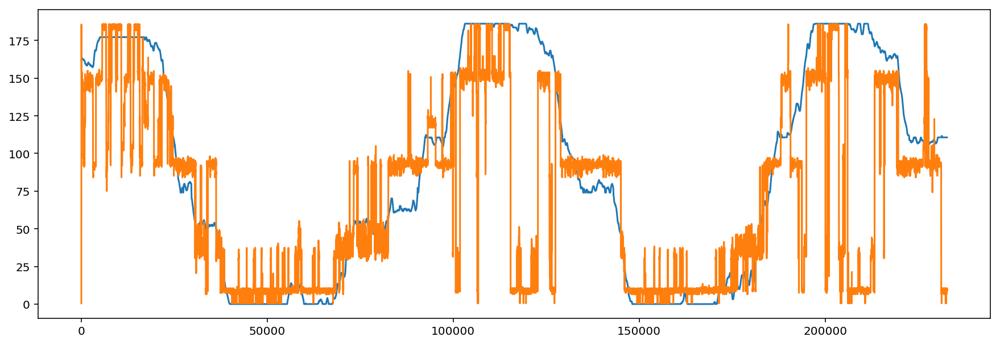

In [294]:
from sklearn.model_selection import TimeSeriesSplit
from replay_identification import ReplayDetector
from sklearn.mixture import BayesianGaussianMixture
from sklearn.metrics import mean_squared_error

use_smoother = False
cv = TimeSeriesSplit(n_splits=5)
time = data['position_info'].index
rmse = []
data_types = {'multiunit'}

replay_detector = ReplayDetector(
    multiunit_density_model=BayesianGaussianMixture,
    multiunit_model_kwargs=dict(n_components=45, tol=1E-6, max_iter=200,
                                weight_concentration_prior=1E2),
    replay_speed=1)

train_index, test_index = next(cv.split(time))

train_is_replay = data['is_ripple'].iloc[train_index]
train_position_info = data['position_info'].iloc[train_index]
if 'spikes' in data_types:
    train_spikes = data['spikes'].iloc[train_index]
else:
    train_spikes = None
if 'multiunit' in data_types:
    train_multiunit = data['multiunit'].isel(time=train_index)
else:
    train_multiunit = None
replay_detector.fit(
    is_replay=train_is_replay, speed=train_position_info[speed_metric],
    position=train_position_info[position_metric], lfp_power=None,
    spikes=train_spikes, multiunit=train_multiunit)

if 'multiunit' in data_types:
    test_multiunit = data['multiunit'].isel(time=test_index)
    predicted_position = predict_position_from_multiunit(
        replay_detector, test_multiunit, use_smoother)
elif 'spikes' in data_types:
    test_spikes = data['spikes'].iloc(time=test_index)
    predicted_position = predict_position_from_spikes(
        replay_detector, test_spikes, use_smoother)

true_position = (data['position_info'][position_metric]
                 .iloc[test_index].values)

plt.figure(figsize=(15, 5))
plt.plot(true_position)
plt.plot(predicted_position);

Text(0.5, 0, 'Time (s)')

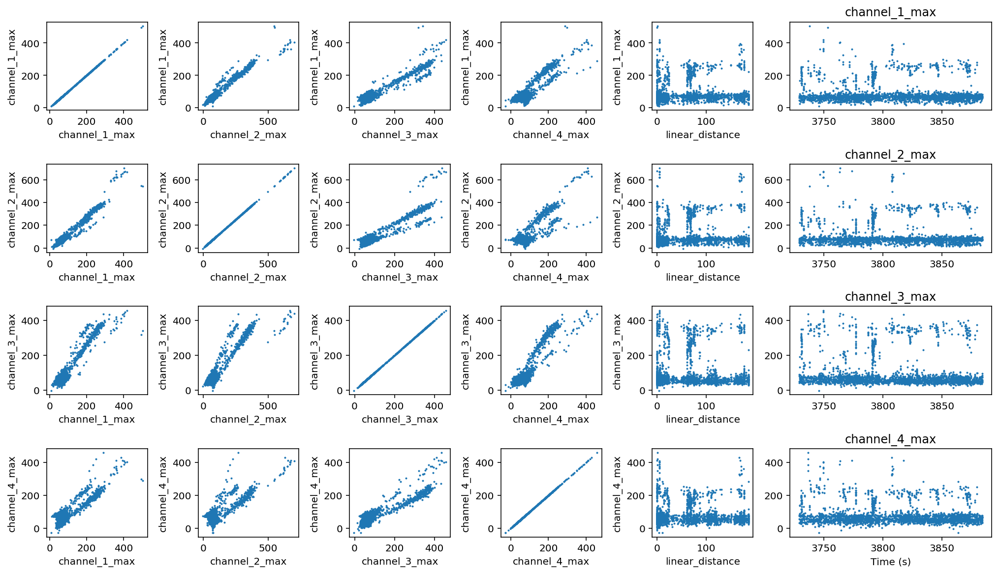

In [344]:
from itertools import product

m = train_multiunit.assign_coords(time=lambda ds: ds.time / np.timedelta64(1, 's')).isel(tetrodes=0)
d = np.concatenate((m.values, train_position_info[position_metric].values[:, np.newaxis]), axis=1)

fig, axes = plt.subplots(4, 6, figsize=(14, 8), constrained_layout=True,
                         gridspec_kw={'width_ratios': [1, 1, 1, 1, 1, 2]})

for c in np.arange(4):
    name = f'channel_{c + 1}_max'
    f = m.sel(features=name).dropna('time')
    axes[c, -1].scatter(f.time, f.values, s=1)
    axes[c, -1].set_title(name)

row_names = m.features.values
column_names = m.features.values.tolist() + [position_metric]
for row, column in product(np.arange(m.shape[1]), np.arange(d.shape[1])):
    axes[row, column].scatter(d[:, column], d[:, row], s=1)
    axes[row, column].set_xlabel(column_names[column])
    axes[row, column].set_ylabel(row_names[row])
axes[-1, -1].set_xlabel('Time (s)')

Text(0.5, 0, 'Time (s)')

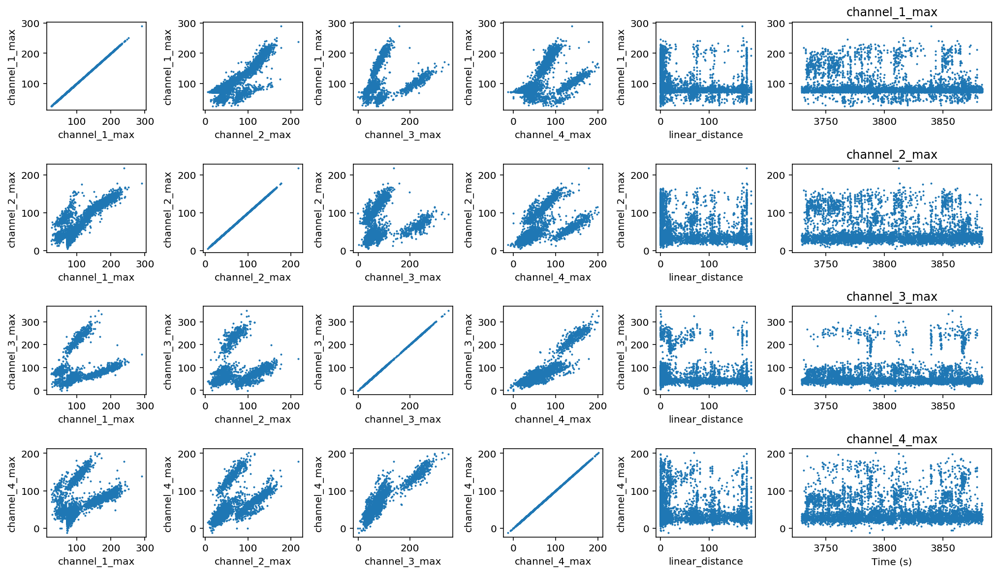

In [348]:
from itertools import product

tetrode_ind = 1

m = train_multiunit.assign_coords(time=lambda ds: ds.time / np.timedelta64(1, 's')).isel(tetrodes=tetrode_ind)
d = np.concatenate((m.values, train_position_info[position_metric].values[:, np.newaxis]), axis=1)

fig, axes = plt.subplots(4, 6, figsize=(14, 8), constrained_layout=True,
                         gridspec_kw={'width_ratios': [1, 1, 1, 1, 1, 2]})

for c in np.arange(4):
    name = f'channel_{c + 1}_max'
    f = m.sel(features=name).dropna('time')
    axes[c, -1].scatter(f.time, f.values, s=1)
    axes[c, -1].set_title(name)

row_names = m.features.values
column_names = m.features.values.tolist() + [position_metric]
for row, column in product(np.arange(m.shape[1]), np.arange(d.shape[1])):
    axes[row, column].scatter(d[:, column], d[:, row], s=1)
    axes[row, column].set_xlabel(column_names[column])
    axes[row, column].set_ylabel(row_names[row])
axes[-1, -1].set_xlabel('Time (s)')

Text(0.5, 0, 'Time (s)')

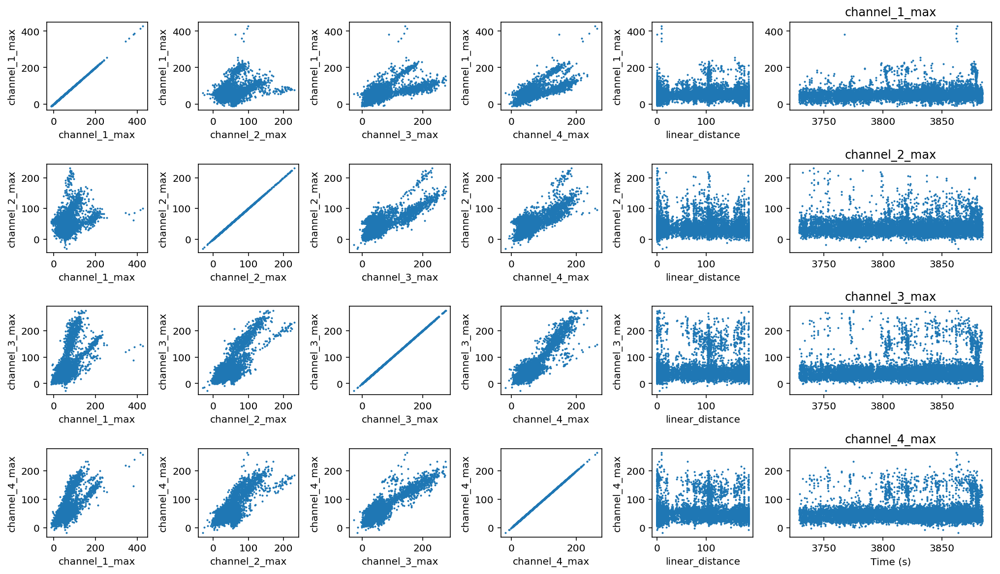

In [349]:
from itertools import product

tetrode_ind = 2

m = train_multiunit.assign_coords(time=lambda ds: ds.time / np.timedelta64(1, 's')).isel(tetrodes=tetrode_ind)
d = np.concatenate((m.values, train_position_info[position_metric].values[:, np.newaxis]), axis=1)

fig, axes = plt.subplots(4, 6, figsize=(14, 8), constrained_layout=True,
                         gridspec_kw={'width_ratios': [1, 1, 1, 1, 1, 2]})

for c in np.arange(4):
    name = f'channel_{c + 1}_max'
    f = m.sel(features=name).dropna('time')
    axes[c, -1].scatter(f.time, f.values, s=1)
    axes[c, -1].set_title(name)

row_names = m.features.values
column_names = m.features.values.tolist() + [position_metric]
for row, column in product(np.arange(m.shape[1]), np.arange(d.shape[1])):
    axes[row, column].scatter(d[:, column], d[:, row], s=1)
    axes[row, column].set_xlabel(column_names[column])
    axes[row, column].set_ylabel(row_names[row])
axes[-1, -1].set_xlabel('Time (s)')

Text(0.5, 0, 'Time (s)')

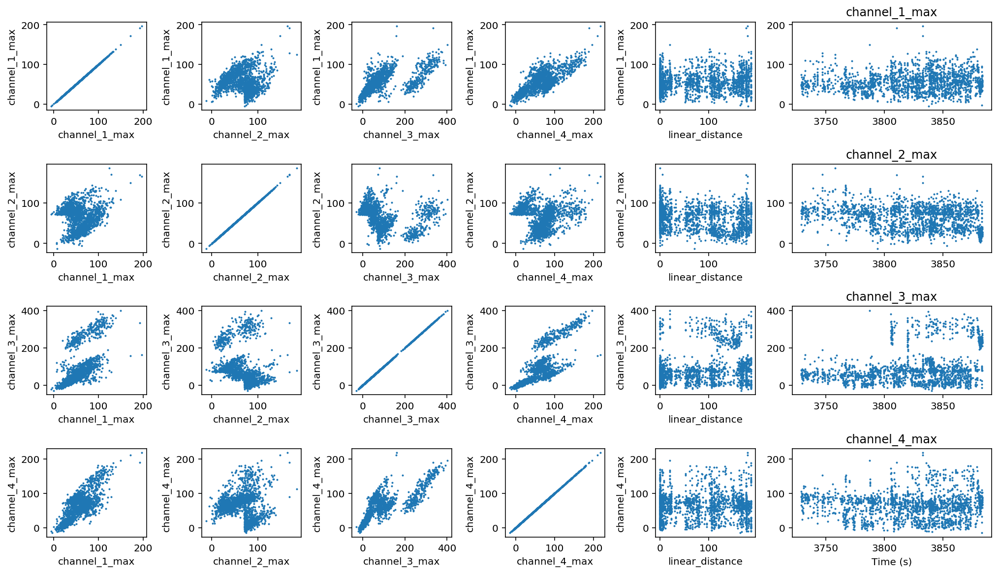

In [350]:
from itertools import product

tetrode_ind = 3

m = train_multiunit.assign_coords(time=lambda ds: ds.time / np.timedelta64(1, 's')).isel(tetrodes=tetrode_ind)
d = np.concatenate((m.values, train_position_info[position_metric].values[:, np.newaxis]), axis=1)

fig, axes = plt.subplots(4, 6, figsize=(14, 8), constrained_layout=True,
                         gridspec_kw={'width_ratios': [1, 1, 1, 1, 1, 2]})

for c in np.arange(4):
    name = f'channel_{c + 1}_max'
    f = m.sel(features=name).dropna('time')
    axes[c, -1].scatter(f.time, f.values, s=1)
    axes[c, -1].set_title(name)

row_names = m.features.values
column_names = m.features.values.tolist() + [position_metric]
for row, column in product(np.arange(m.shape[1]), np.arange(d.shape[1])):
    axes[row, column].scatter(d[:, column], d[:, row], s=1)
    axes[row, column].set_xlabel(column_names[column])
    axes[row, column].set_ylabel(row_names[row])
axes[-1, -1].set_xlabel('Time (s)')

Text(0.5, 0, 'Time (s)')

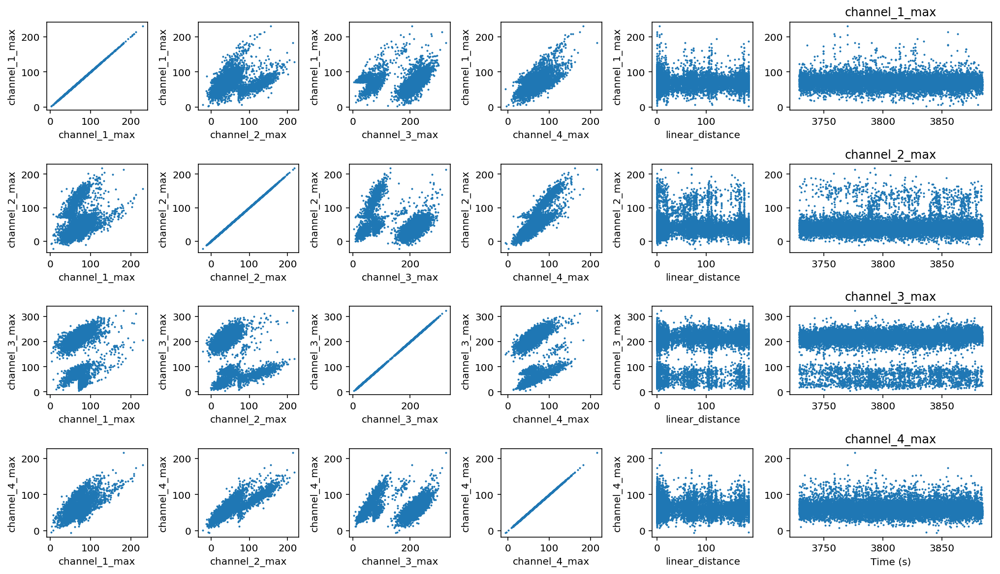

In [355]:
from itertools import product

tetrode_ind = 11

m = train_multiunit.assign_coords(time=lambda ds: ds.time / np.timedelta64(1, 's')).isel(tetrodes=tetrode_ind)
d = np.concatenate((m.values, train_position_info[position_metric].values[:, np.newaxis]), axis=1)

fig, axes = plt.subplots(4, 6, figsize=(14, 8), constrained_layout=True,
                         gridspec_kw={'width_ratios': [1, 1, 1, 1, 1, 2]})

for c in np.arange(4):
    name = f'channel_{c + 1}_max'
    f = m.sel(features=name).dropna('time')
    axes[c, -1].scatter(f.time, f.values, s=1)
    axes[c, -1].set_title(name)

row_names = m.features.values
column_names = m.features.values.tolist() + [position_metric]
for row, column in product(np.arange(m.shape[1]), np.arange(d.shape[1])):
    axes[row, column].scatter(d[:, column], d[:, row], s=1)
    axes[row, column].set_xlabel(column_names[column])
    axes[row, column].set_ylabel(row_names[row])
axes[-1, -1].set_xlabel('Time (s)')

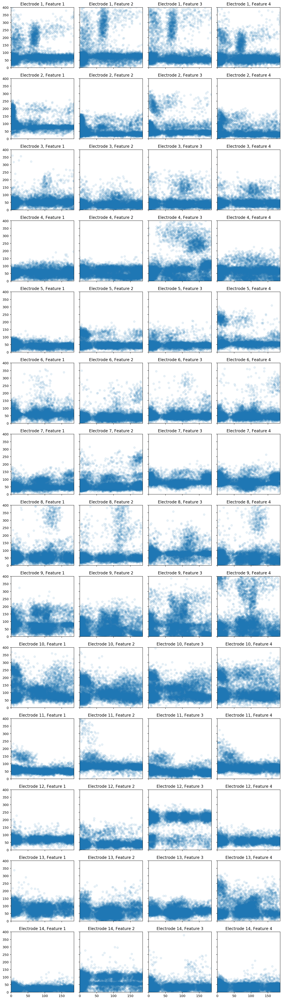

In [354]:
replay_detector.plot_fitted_multiunit_model();

In [356]:
likelihood_model = replay_detector._multiunit_likelihood.keywords
place_bin_centers = replay_detector.place_bin_centers
occupancy_model = likelihood_model['occupancy_model']
joint_models = likelihood_model['joint_models']
marginal_models = likelihood_model['marginal_models']
mean_rates = likelihood_model['mean_rates']
time_bin_size = replay_detector.time_bin_size

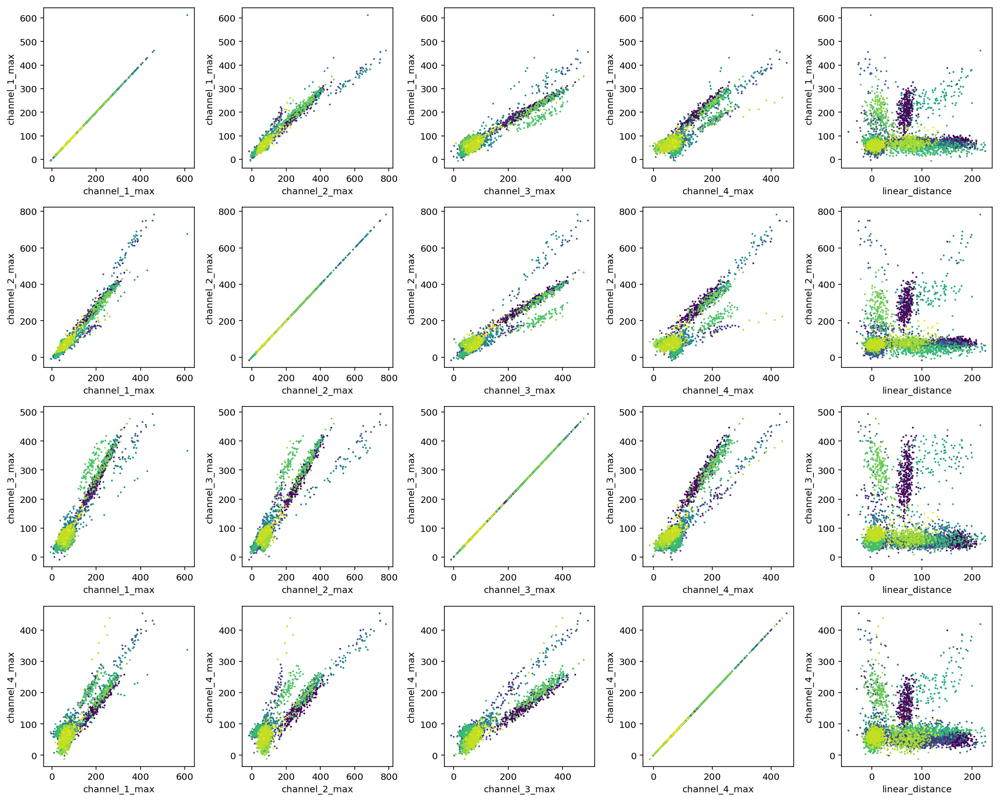

In [397]:
tetrode_ind = 0
samples, labels = joint_models[tetrode_ind].sample(5000)

fig, axes = plt.subplots(4, 5, figsize=(15, 12), constrained_layout=True)

row_names = m.features.values.tolist()
column_names = m.features.values.tolist() + [position_metric]

for row, column in product(np.arange(4), np.arange(5)):
    axes[row, column].scatter(samples[:, column], samples[:, row], s=1, c=labels)
    axes[row, column].set_xlabel(column_names[column])
    axes[row, column].set_ylabel(row_names[row])

INFO:replay_identification.decoders:Fitting speed model...
INFO:replay_identification.decoders:Fitting multiunit model...
/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)


/Users/edeno/miniconda3/envs/Replay_ID_2018/lib/python3.6/site-packages/sklearn/mixture/base.py:273: ConvergenceWarning: Initialization 1 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  % (init + 1), ConvergenceWarning)
INFO:replay_identification.decoders:Fitting movement state transition...
INFO:replay_identification.decoders:Fitting replay state transition...


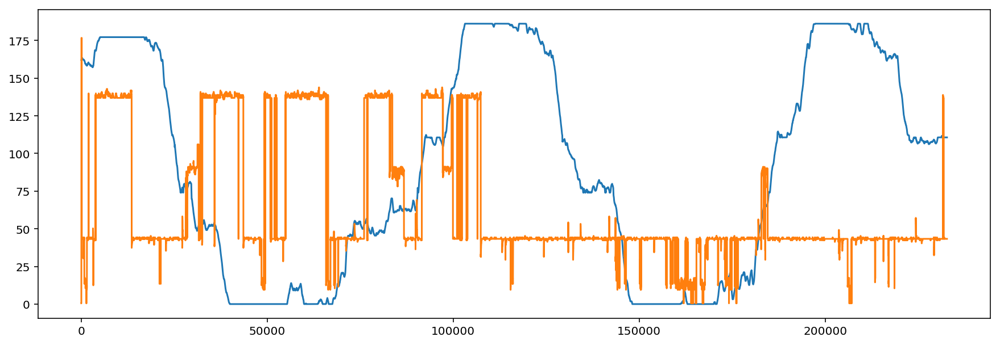

In [401]:
from sklearn.model_selection import TimeSeriesSplit
from replay_identification import ReplayDetector
from sklearn.mixture import BayesianGaussianMixture
from sklearn.metrics import mean_squared_error

use_smoother = False
cv = TimeSeriesSplit(n_splits=5)
time = data['position_info'].index
rmse = []
data_types = {'multiunit'}

replay_detector = ReplayDetector(
    multiunit_density_model=BayesianGaussianMixture,
    multiunit_model_kwargs=dict(n_components=45, tol=1E-6, max_iter=200,
                                weight_concentration_prior=1E2),
    replay_speed=1)

train_index, test_index = next(cv.split(time))

train_is_replay = data['is_ripple'].iloc[train_index]
train_position_info = data['position_info'].iloc[train_index]
if 'spikes' in data_types:
    train_spikes = data['spikes'].iloc[train_index]
else:
    train_spikes = None
if 'multiunit' in data_types:
    train_multiunit = data['multiunit'].isel(time=train_index)
else:
    train_multiunit = None
replay_detector.fit(
    is_replay=train_is_replay, speed=train_position_info[speed_metric],
    position=train_position_info[position_metric], lfp_power=None,
    spikes=train_spikes, multiunit=train_multiunit.isel(tetrodes=[0]))

if 'multiunit' in data_types:
    test_multiunit = data['multiunit'].isel(time=test_index).isel(tetrodes=[0])
    predicted_position = predict_position_from_multiunit(
        replay_detector, test_multiunit, use_smoother)
elif 'spikes' in data_types:
    test_spikes = data['spikes'].iloc(time=test_index)
    predicted_position = predict_position_from_spikes(
        replay_detector, test_spikes, use_smoother)

true_position = (data['position_info'][position_metric]
                 .iloc[test_index].values)

plt.figure(figsize=(15, 5))
plt.plot(true_position)
plt.plot(predicted_position);

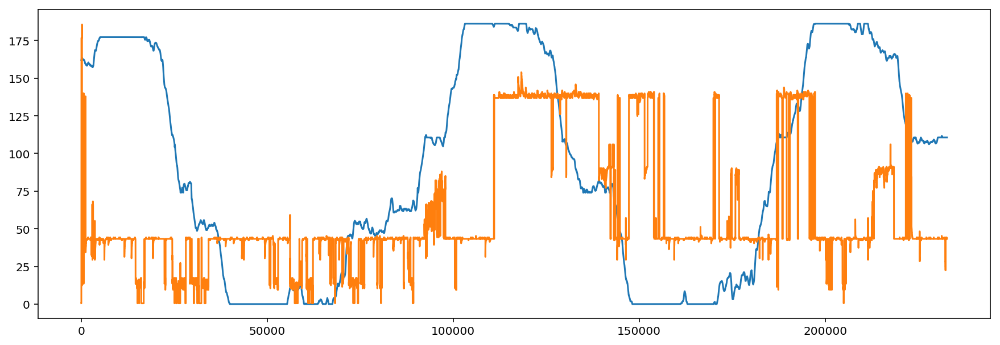

In [403]:
predicted_position = predict_position_from_multiunit(
    replay_detector, train_multiunit.isel(tetrodes=[0]), use_smoother)

plt.figure(figsize=(15, 5))
plt.plot(true_position)
plt.plot(predicted_position);

In [404]:
likelihood_model = replay_detector._multiunit_likelihood.keywords
place_bin_centers = replay_detector.place_bin_centers
occupancy_model = likelihood_model['occupancy_model']
joint_models = likelihood_model['joint_models']
marginal_models = likelihood_model['marginal_models']
mean_rates = likelihood_model['mean_rates']
time_bin_size = replay_detector.time_bin_size

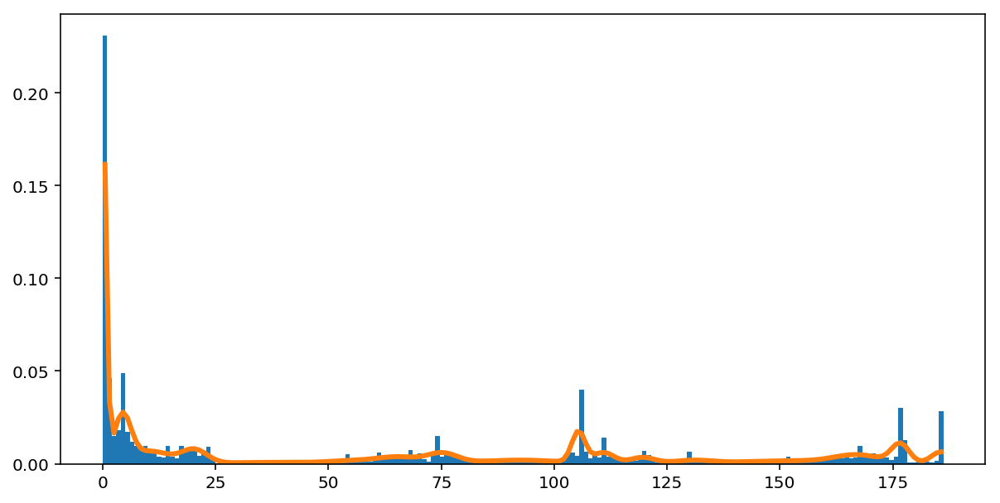

In [435]:
from replay_identification.multiunit_likelihood import estimate_occupancy

occupancy = estimate_occupancy(place_bin_centers, occupancy_model)

plt.figure(figsize=(10, 5))
plt.hist(train_position_info[position_metric].values[~train_is_replay.squeeze()],
         bins=replay_detector.place_bin_edges, density=True)
plt.plot(place_bin_centers, occupancy, linewidth=3)

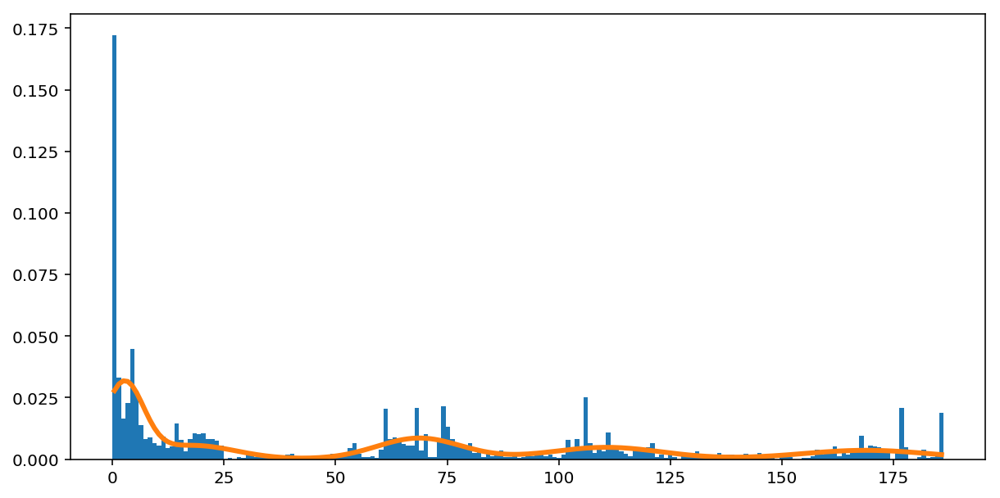

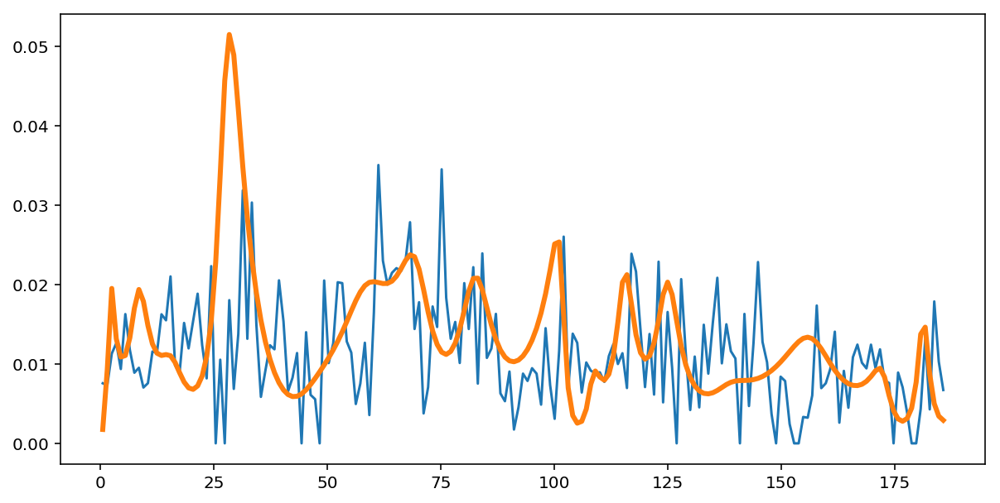

In [448]:
from replay_identification.multiunit_likelihood import estimate_ground_process_intensity, atleast_2d

gpi = estimate_ground_process_intensity(
    place_bin_centers, occupancy, marginal_models[0], mean_rates[0])

place_field = np.exp(marginal_models[0]
                     .score_samples(atleast_2d(place_bin_centers)))

m = train_multiunit.isel(tetrodes=0).values[~train_is_replay.squeeze()]
is_spike = np.any(~np.isnan(m), axis=1)
p = train_position_info[position_metric].values[~train_is_replay.squeeze()]
position_at_spike = p[is_spike]

plt.figure(figsize=(10, 5))
plt.hist(position_at_spike,
         bins=replay_detector.place_bin_edges, density=True)
plt.plot(place_bin_centers, place_field, linewidth=3)


histogram_occupancy, _ = np.histogram(
    train_position_info[position_metric].values[~train_is_replay.squeeze()],
    bins=replay_detector.place_bin_edges, density=True)
histogram_place_field, _ = np.histogram(position_at_spike,
         bins=replay_detector.place_bin_edges, density=True)

histogram_gpi = np.log(mean_rates[0]) + np.log(histogram_place_field) - np.log(histogram_occupancy)
histogram_gpi = np.exp(histogram_gpi)

plt.figure(figsize=(10, 5))
plt.plot(place_bin_centers, histogram_gpi)
plt.plot(place_bin_centers, gpi, linewidth=3)

In [497]:
from tqdm.auto import tqdm

def estimate_ground_process_intensity(position, occupancy,
                                      marginal_model, mean_rate):
    '''Computes the rate function of position marginalized over mark.

    Parameters
    ----------
    position : ndarray, shape (n_time, n_position_dims)
    occupancy : ndarray, shape (n_position_dims,)
    marginal_model : fitted density model
    mean_rate : float

    Returns
    -------
    ground_process_intensity : ndarray, shape (n_time,)

    '''
    place_field = marginal_model.score_samples(atleast_2d(position))
    return np.exp(np.log(mean_rate) + place_field - np.log(occupancy))



def estimate_log_joint_mark_intensity(
        multiunit, position, joint_model, mean_rate, occupancy):
    '''Computes the rate function of position and mark.

    Parameters
    ----------
    multiunit : ndarray, shape  (n_time, n_features)
    position : ndarray, shape  (n_time, n_position_dims)
    joint_model : fitted density model
    mean_rate : float
    occupancy : ndarray, shape (n_time,)

    Returns
    -------
    log_joint_mark_intensity : ndarray, shape (n_time,)

    '''
    multiunit, position = atleast_2d(multiunit), atleast_2d(position)
    is_spike = (np.any(~np.isnan(multiunit), axis=1) &
                np.all(~np.isnan(position), axis=1))
    not_nan_marks = np.any(~np.isnan(multiunit), axis=0)

    log_joint_mark_intensity = np.zeros((position.shape[0],))
    log_joint_mark_intensity[is_spike] = (
        mean_rate +
        joint_model.score_samples(np.concatenate(
            (multiunit[is_spike][:, not_nan_marks], position[is_spike]),
            axis=1)) - occupancy)
    return log_joint_mark_intensity

def poisson_mark_log_likelihood(log_joint_mark_intensity,
                                ground_process_intensity, time_bin_size=1):
    '''Probability of parameters given spiking indicator at a particular
    time and associated marks.

    Parameters
    ----------
    log_joint_mark_intensity : ndarray, shape (n_time, n_position)
    ground_process_intensity : ndarray, shape (n_time, n_position)
        Probability of observing a spike regardless of multiunit.
    time_bin_size : float, optional

    Returns
    -------
    poisson_mark_log_likelihood : ndarray, shape (n_time, n_position)

    '''
    return np.log(time_bin_size) + log_joint_mark_intensity - (
        ground_process_intensity * time_bin_size)

multiunit= np.array(train_multiunit.isel(tetrodes=0))[np.newaxis, :]
n_bin = place_bin_centers.size
n_time = multiunit.shape[1]
log_likelihood = np.zeros((n_time, n_bin))

occupancy = estimate_occupancy(place_bin_centers, occupancy_model)

for m, joint_model, marginal_model, mean_rate in zip(
        tqdm(multiunit, desc='electrodes'), joint_models, marginal_models,
        mean_rates):
    ground_process_intensity = np.atleast_2d(
        estimate_ground_process_intensity(
            place_bin_centers, occupancy, marginal_model, mean_rate))
    log_joint_mark_intensity = np.stack([
        estimate_log_joint_mark_intensity(
            m, place_bin * np.ones((n_time, 1)), joint_model, mean_rate,
            occ)
        for occ, place_bin in zip(occupancy, place_bin_centers)], axis=1)
    log_likelihood += poisson_mark_log_likelihood(
        log_joint_mark_intensity, ground_process_intensity, time_bin_size)

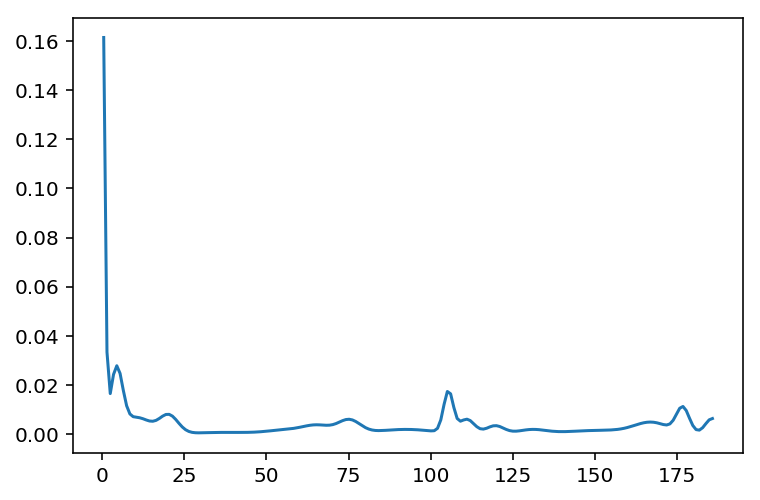

In [525]:
plt.plot(place_bin_centers, occupancy.squeeze())

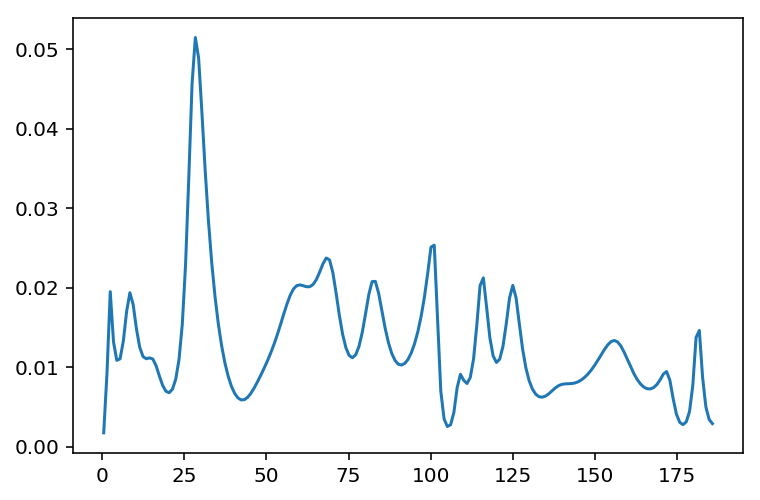

In [524]:
plt.plot(place_bin_centers, ground_process_intensity.squeeze())

Text(0.5, 1.0, 'Likelihood')

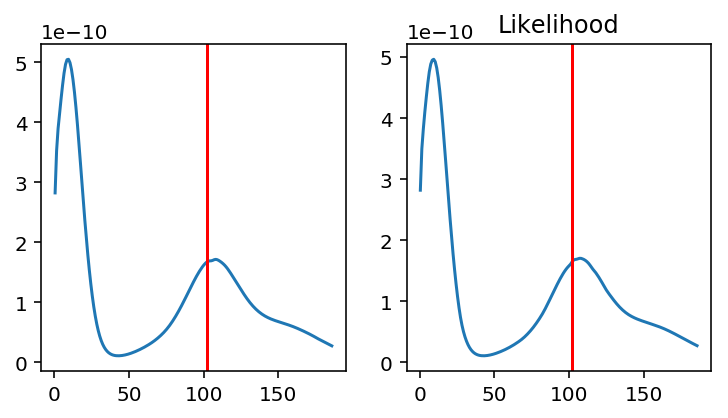

In [550]:
ind = np.nonzero(is_spike)[0][-60]

fig, axes = plt.subplots(1, 2, figsize=(6, 3))
axes[0].plot(place_bin_centers, np.exp(log_joint_mark_intensity[ind]))
axes[0].axvline(train_position_info.linear_distance.values[ind], color='red')
axes[1].set_title('Joint Mark Intensity')

axes[1].plot(place_bin_centers, np.exp(log_likelihood[ind]))
axes[1].axvline(train_position_info.linear_distance.values[ind], color='red')
axes[1].set_title('Likelihood')

In [551]:
def estimate_replay_log_likelihood(
        multiunit, place_bin_centers, occupancy_model,
        joint_models, marginal_models, mean_rates, time_bin_size):
    '''Estimate the log likelihood of being at any position.

    Parameters
    ----------
    multiunit : ndarray, shape (n_electrodes, n_time, n_features)
    place_bin_centers : ndarray, shape (n_place_bins,)
    occupancy_model : fitted density model
    marginal_models : list of fitted density models, len (n_electrodes,)
    mean_rates : list of floats, shape (n_electrodes,)
    time_bin_size : float

    Returns
    -------
    replay_log_likelihood : ndarray, shape (n_time, n_place_bins)

    '''

    n_bin = place_bin_centers.size
    n_time = multiunit.shape[1]
    log_likelihood = np.zeros((n_time, n_bin))

    occupancy = estimate_occupancy(place_bin_centers, occupancy_model)

    for m, joint_model, marginal_model, mean_rate in zip(
            tqdm(multiunit, desc='electrodes'), joint_models, marginal_models,
            mean_rates):
        ground_process_intensity = np.atleast_2d(
            estimate_ground_process_intensity(
                place_bin_centers, occupancy, marginal_model, mean_rate))
        log_joint_mark_intensity = np.stack([
            estimate_log_joint_mark_intensity(
                m, place_bin * np.ones((n_time, 1)), joint_model, mean_rate,
                occ)
            for occ, place_bin in zip(occupancy, place_bin_centers)], axis=1)
        log_likelihood += poisson_mark_log_likelihood(
            log_joint_mark_intensity, ground_process_intensity, time_bin_size)

    return log_likelihood

def predict_position_from_multiunit(replay_detector, multiunits, use_smoother):
    multiunits = np.asarray(multiunits.copy())
    likelihood_model = replay_detector._multiunit_likelihood.keywords
    place_bin_centers = replay_detector.place_bin_centers
    occupancy_model = likelihood_model['occupancy_model']
    joint_models = likelihood_model['joint_models']
    marginal_models = likelihood_model['marginal_models']
    mean_rates = likelihood_model['mean_rates']
    time_bin_size = replay_detector.time_bin_size

    likelihood = np.exp(estimate_replay_log_likelihood(
        np.moveaxis(multiunits, -1, 0), place_bin_centers,
        occupancy_model, joint_models, marginal_models, mean_rates,
        time_bin_size))
    place_bin_size = np.diff(replay_detector.place_bin_edges)[0]

    state_transition = replay_detector._movement_state_transition
    initial_conditions = (np.ones_like(place_bin_centers) /
                          place_bin_centers.size / place_bin_size)
    results = filter(
        initial_conditions=initial_conditions,
        state_transition=state_transition,
        likelihood=likelihood,
        bin_size=place_bin_size)

    if use_smoother:
        results = smooth(
            filter_posterior=results['posterior_density'][..., np.newaxis, :],
            state_transition=state_transition,
            bin_size=place_bin_size)
        results['likelihood'] = likelihood

    max_ind = np.argmax(np.log(results['posterior_density'].squeeze()), axis=1)
    return place_bin_centers[max_ind]

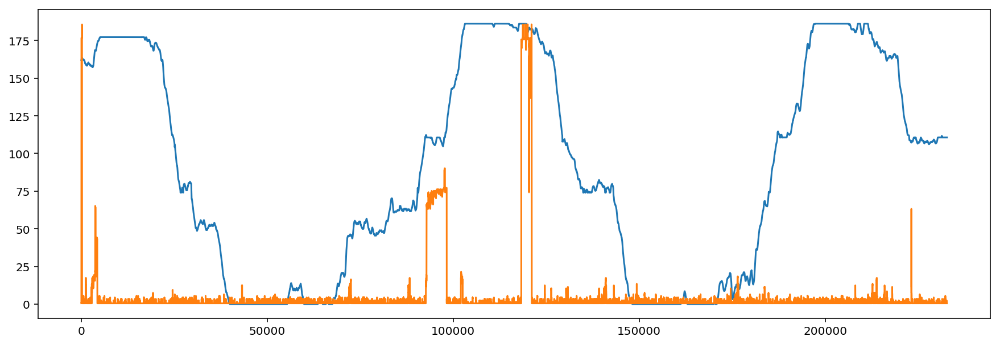

In [552]:
predicted_position = predict_position_from_multiunit(
    replay_detector, train_multiunit.isel(tetrodes=[0]), use_smoother)

plt.figure(figsize=(15, 5))
plt.plot(true_position)
plt.plot(predicted_position);